<a href="https://colab.research.google.com/github/er-Bot/NoteBooks/blob/main/GAN_MBIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

torch.manual_seed(0) # Set for testing purposes, please do not change!

In [24]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), num=0):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

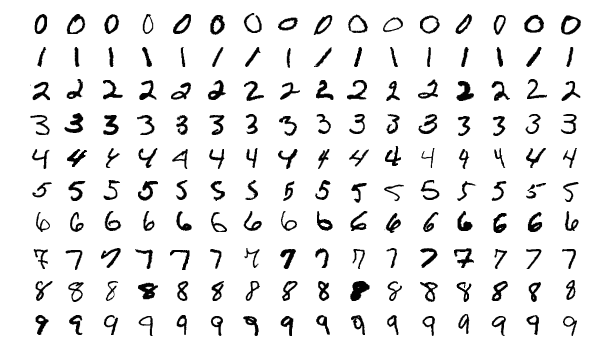

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [5]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

In [6]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
        
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.


In [7]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    return torch.randn(n_samples, z_dim, device=device)

## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
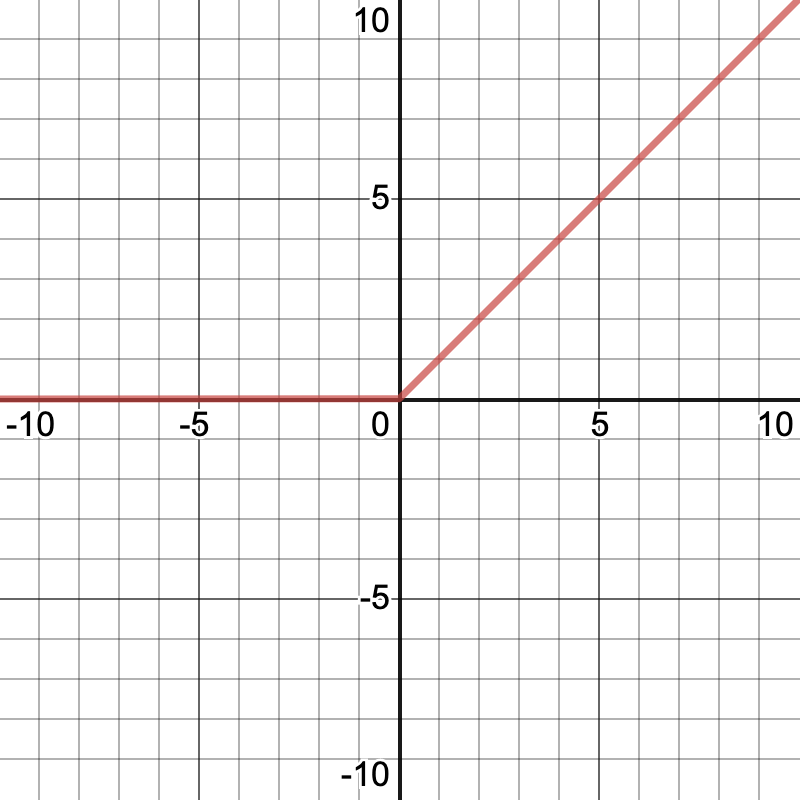  |  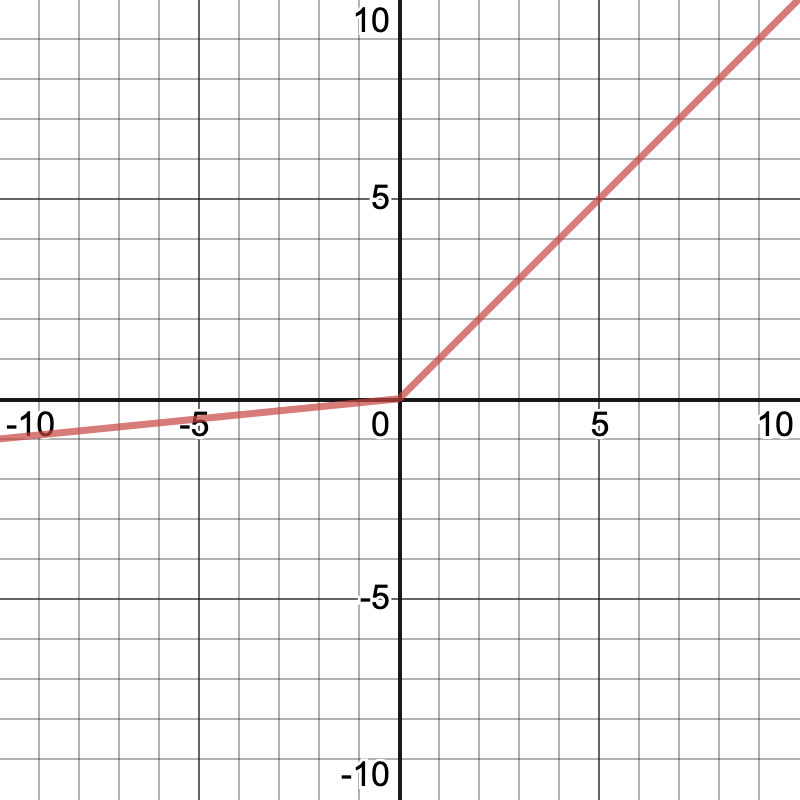


In [8]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.

In [9]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [10]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda'

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!





/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [11]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [16]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    noise = get_noise(num_images, z_dim, device=device)
    fake_image_gen = gen(noise)
    fake_image_pred = disc(fake_image_gen.detach())
    fake_image_loss = criterion(fake_image_pred, torch.zeros_like(fake_image_pred))
    real_image_pred = disc(real)
    real_image_loss = criterion(real_image_pred, torch.ones_like(real_image_pred))
    disc_loss = (fake_image_loss + real_image_loss) / 2
    return disc_loss

In [17]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    noise = get_noise(num_images, z_dim, device=device)
    fake_image_gen = gen(noise)
    fake_image_pred = disc(fake_image_gen)
    gen_loss = criterion(fake_image_pred, torch.ones_like(fake_image_pred))
    return gen_loss

Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
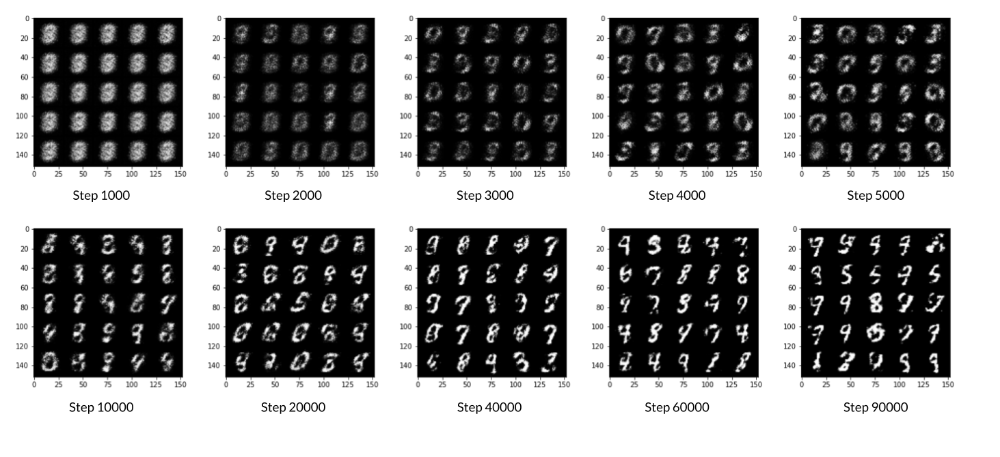

Epoch 1, step 500: Generator loss: 3.8665860962867757, discriminator loss: 0.08521979472041133


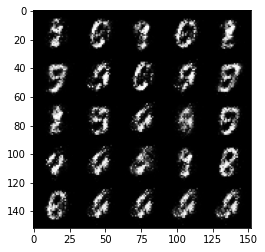

Epoch 2, step 1000: Generator loss: 3.9975372629165595, discriminator loss: 0.07167355524003502


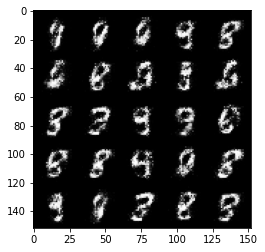

Epoch 3, step 1500: Generator loss: 3.9648670573234583, discriminator loss: 0.08143470856547368


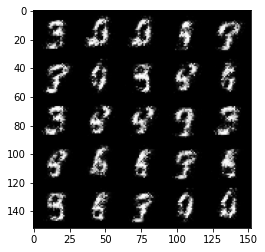

Epoch 4, step 2000: Generator loss: 3.8927925477027903, discriminator loss: 0.08647023315727717


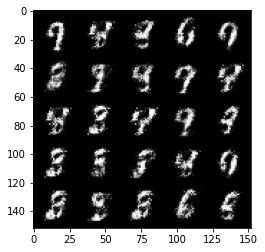

Epoch 5, step 2500: Generator loss: 3.8354580993652365, discriminator loss: 0.09828635566681632


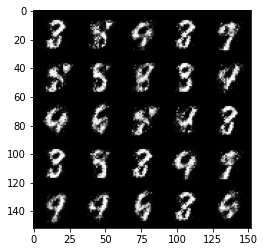

Epoch 6, step 3000: Generator loss: 3.7586873245239243, discriminator loss: 0.08852873340994122


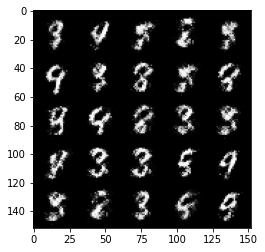

Epoch 7, step 3500: Generator loss: 3.752759208202361, discriminator loss: 0.09621561216562993


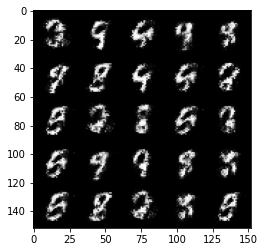

Epoch 8, step 4000: Generator loss: 3.6771039667129495, discriminator loss: 0.1024570693075657


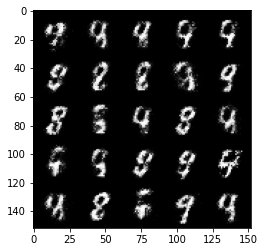

Epoch 9, step 4500: Generator loss: 3.7069054760932882, discriminator loss: 0.1050163620710372


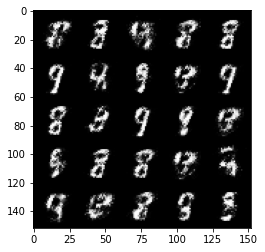

Epoch 10, step 5000: Generator loss: 3.629698250770569, discriminator loss: 0.12826926054805513


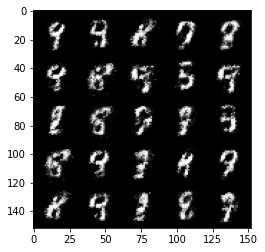

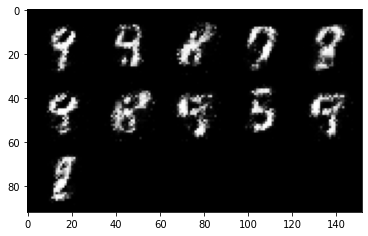

Epoch 11, step 5500: Generator loss: 3.5386962800025956, discriminator loss: 0.1223896318227053


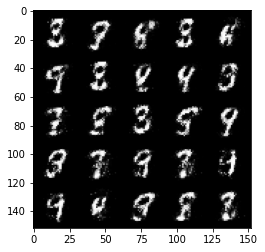

Epoch 12, step 6000: Generator loss: 3.7904234519004842, discriminator loss: 0.11186239743232729


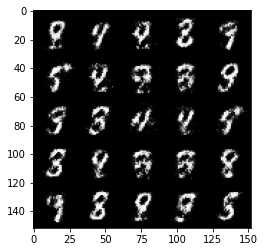

Epoch 13, step 6500: Generator loss: 3.477586199760435, discriminator loss: 0.12803621744364505


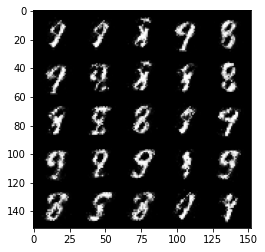

Epoch 14, step 7000: Generator loss: 3.605295174121856, discriminator loss: 0.10903411881625655


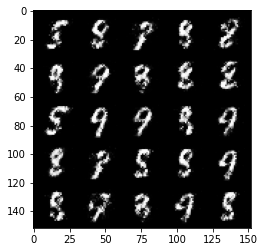

Epoch 15, step 7500: Generator loss: 3.4584489536285363, discriminator loss: 0.13915531839430334


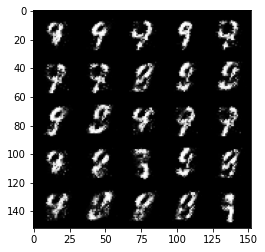

Epoch 17, step 8000: Generator loss: 3.454886349678038, discriminator loss: 0.15238044826686375


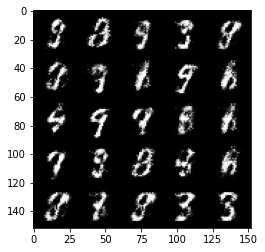

Epoch 18, step 8500: Generator loss: 3.3264214220046995, discriminator loss: 0.14209720614552504


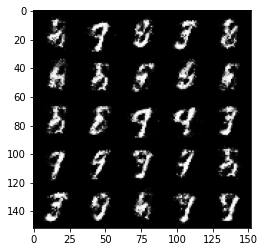

Epoch 19, step 9000: Generator loss: 3.292157798290253, discriminator loss: 0.14227118051052084


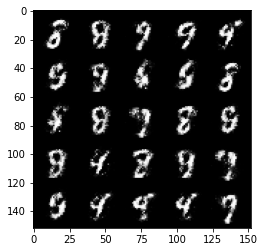

Epoch 20, step 9500: Generator loss: 3.331068674564364, discriminator loss: 0.14440480527281754


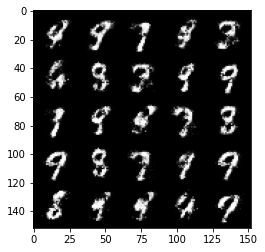

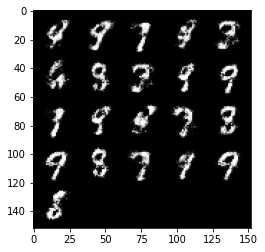

Epoch 21, step 10000: Generator loss: 3.292961172103881, discriminator loss: 0.1406748790368438


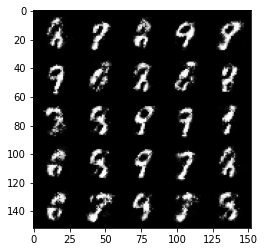

Epoch 22, step 10500: Generator loss: 3.2578321504592904, discriminator loss: 0.13922650186717508


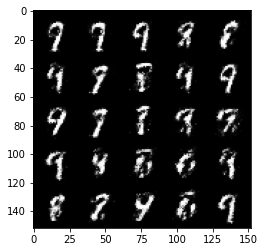

Epoch 23, step 11000: Generator loss: 3.366874680519106, discriminator loss: 0.14657262609899044


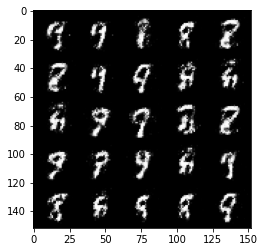

Epoch 24, step 11500: Generator loss: 3.467705729007721, discriminator loss: 0.13247798696905377


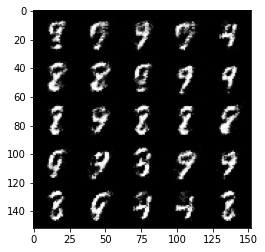

Epoch 25, step 12000: Generator loss: 3.155699216365818, discriminator loss: 0.15567210450768476


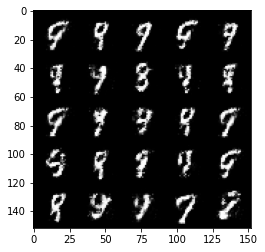

Epoch 26, step 12500: Generator loss: 3.0720626797676087, discriminator loss: 0.1786592780202626


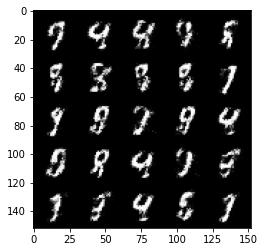

Epoch 27, step 13000: Generator loss: 3.021357216358183, discriminator loss: 0.16702062484622


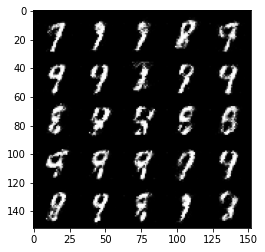

Epoch 28, step 13500: Generator loss: 3.1066685633659357, discriminator loss: 0.1679001755267381


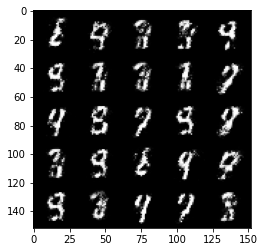

Epoch 29, step 14000: Generator loss: 3.1055835828781135, discriminator loss: 0.1598773553967475


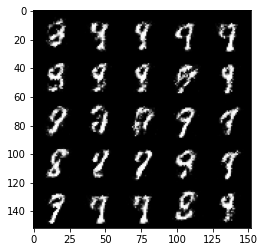

Epoch 30, step 14500: Generator loss: 3.1206592888832096, discriminator loss: 0.17780127298831938


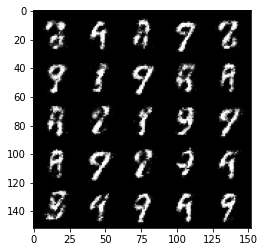

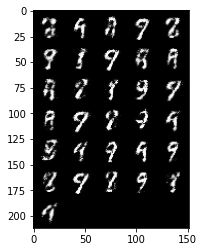

Epoch 31, step 15000: Generator loss: 3.052309315204617, discriminator loss: 0.1763544276803732


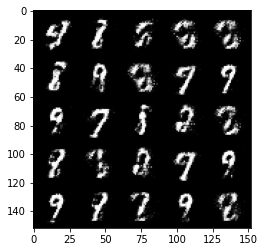

Epoch 33, step 15500: Generator loss: 2.9542807512283327, discriminator loss: 0.20273274397850058


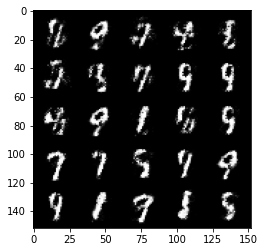

Epoch 34, step 16000: Generator loss: 2.9639951248168934, discriminator loss: 0.19914945808053017


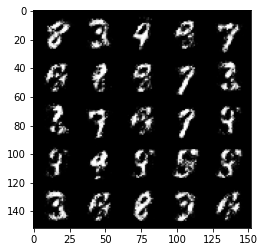

Epoch 35, step 16500: Generator loss: 2.974790773868561, discriminator loss: 0.20485509638488303


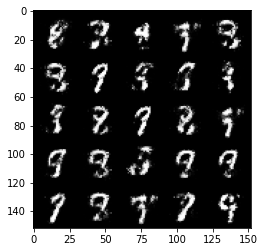

Epoch 36, step 17000: Generator loss: 2.7790107216835036, discriminator loss: 0.2099008786231279


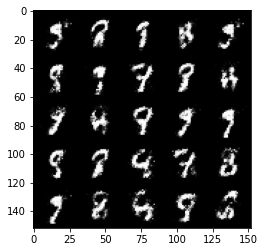

Epoch 37, step 17500: Generator loss: 2.8648005089759803, discriminator loss: 0.20466667482256878


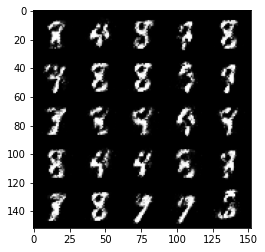

Epoch 38, step 18000: Generator loss: 2.8839015917778035, discriminator loss: 0.1903364321589471


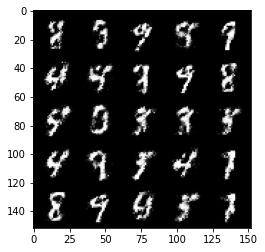

Epoch 39, step 18500: Generator loss: 2.8073136477470393, discriminator loss: 0.2015433143228296


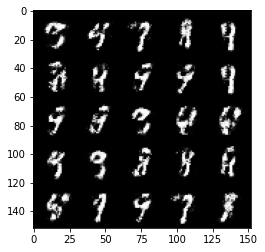

Epoch 40, step 19000: Generator loss: 2.951361162185667, discriminator loss: 0.181661525979638


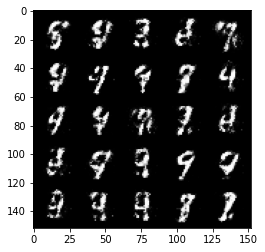

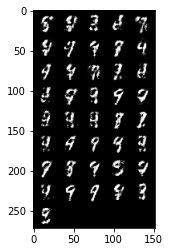

Epoch 41, step 19500: Generator loss: 2.77130043554306, discriminator loss: 0.21012869536876674


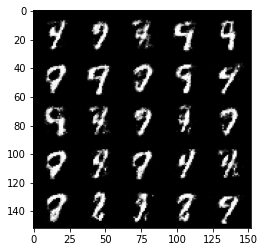

Epoch 42, step 20000: Generator loss: 2.662345274925231, discriminator loss: 0.21858679406344894


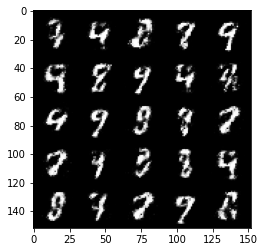

Epoch 43, step 20500: Generator loss: 2.6564521546363813, discriminator loss: 0.21584304176270971


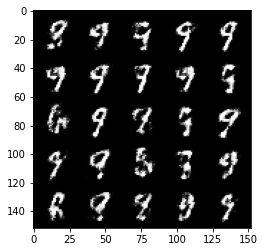

Epoch 44, step 21000: Generator loss: 2.5778845853805548, discriminator loss: 0.2201398602426051


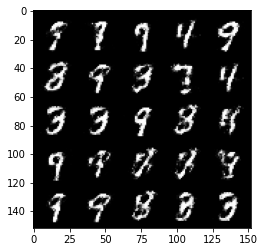

Epoch 45, step 21500: Generator loss: 2.7289852018356346, discriminator loss: 0.20368651846051214


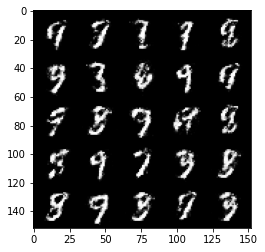

Epoch 46, step 22000: Generator loss: 2.565123542308807, discriminator loss: 0.24608121204376232


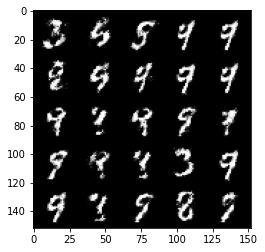

Epoch 47, step 22500: Generator loss: 2.639390106678007, discriminator loss: 0.2248315196931362


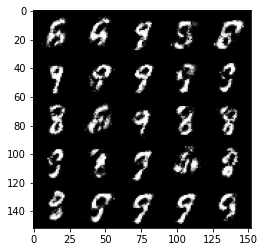

Epoch 49, step 23000: Generator loss: 2.47678213262558, discriminator loss: 0.24939710131287562


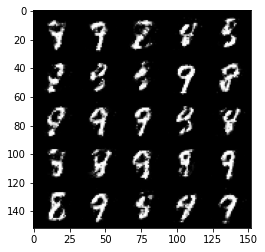

Epoch 50, step 23500: Generator loss: 2.4786634817123407, discriminator loss: 0.248948978304863


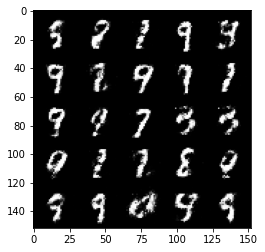

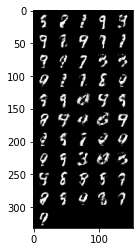

Epoch 51, step 24000: Generator loss: 2.5701096320152286, discriminator loss: 0.22683089345693594


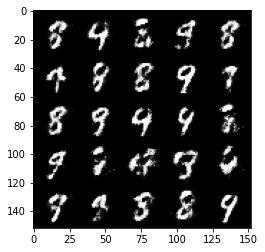

Epoch 52, step 24500: Generator loss: 2.4220757677555107, discriminator loss: 0.2678017278611659


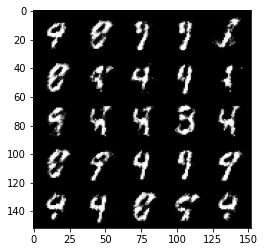

Epoch 53, step 25000: Generator loss: 2.4573616909980784, discriminator loss: 0.24227279213070843


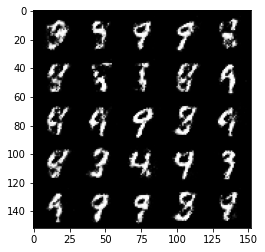

Epoch 54, step 25500: Generator loss: 2.53452229475975, discriminator loss: 0.22614587453007684


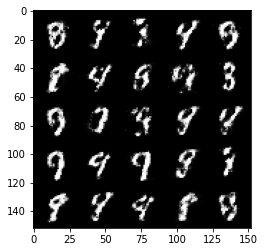

Epoch 55, step 26000: Generator loss: 2.432984704494475, discriminator loss: 0.24685818988084812


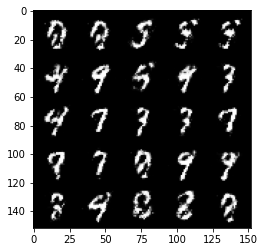

Epoch 56, step 26500: Generator loss: 2.3909238054752358, discriminator loss: 0.25891362982988364


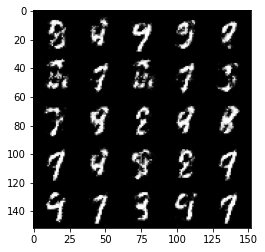

Epoch 57, step 27000: Generator loss: 2.369915446043016, discriminator loss: 0.25094329458475106


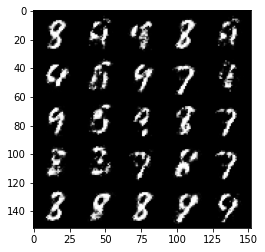

Epoch 58, step 27500: Generator loss: 2.358549192667009, discriminator loss: 0.26002466914057737


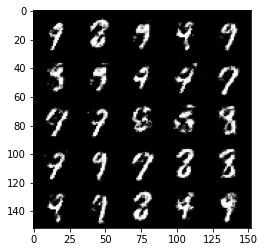

Epoch 59, step 28000: Generator loss: 2.304986859083177, discriminator loss: 0.26916396859288205


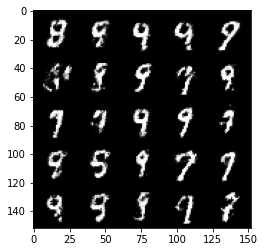

Epoch 60, step 28500: Generator loss: 2.220820160865783, discriminator loss: 0.2907133376300334


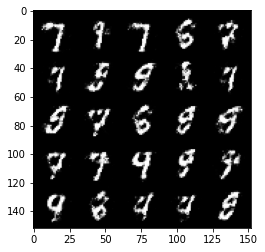

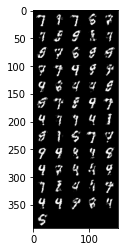

Epoch 61, step 29000: Generator loss: 2.302355207920075, discriminator loss: 0.2530585002601147


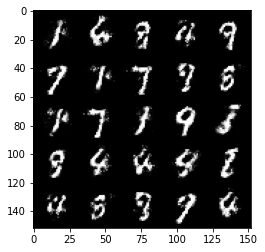

Epoch 62, step 29500: Generator loss: 2.2950758597850798, discriminator loss: 0.2628060120940208


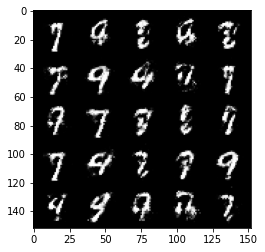

Epoch 63, step 30000: Generator loss: 2.234028373003005, discriminator loss: 0.276934185385704


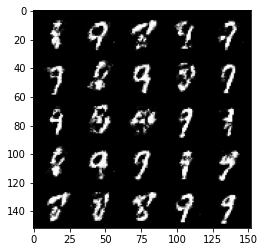

Epoch 65, step 30500: Generator loss: 2.3790666124820716, discriminator loss: 0.2506559752821925


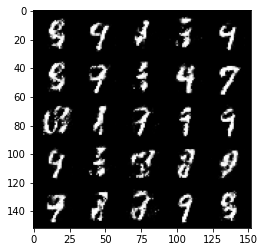

Epoch 66, step 31000: Generator loss: 2.2949208669662466, discriminator loss: 0.26187662419676777


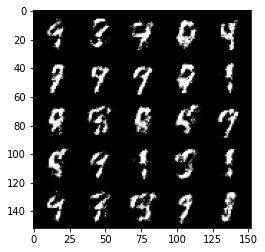

Epoch 67, step 31500: Generator loss: 2.2933103015422813, discriminator loss: 0.26688653025031095


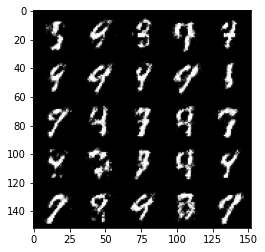

Epoch 68, step 32000: Generator loss: 2.174982176542281, discriminator loss: 0.296752619087696


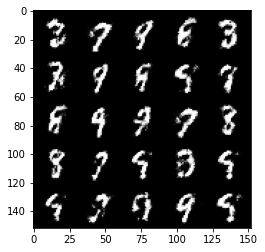

Epoch 69, step 32500: Generator loss: 2.2069619777202587, discriminator loss: 0.2869863024055956


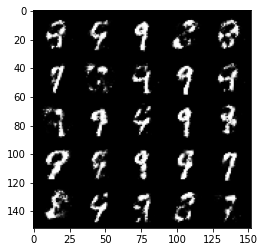

Epoch 70, step 33000: Generator loss: 2.153585698843, discriminator loss: 0.29720579659938784


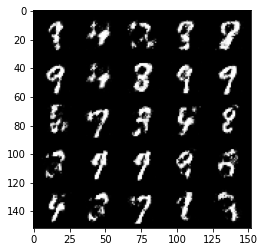

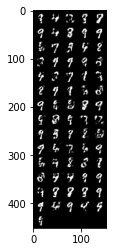

Epoch 71, step 33500: Generator loss: 2.188880567073821, discriminator loss: 0.298580080449581


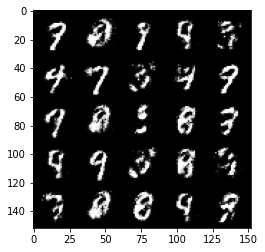

Epoch 72, step 34000: Generator loss: 2.0580251181125635, discriminator loss: 0.3170624861717221


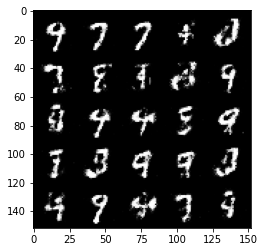

Epoch 73, step 34500: Generator loss: 2.0611930267810803, discriminator loss: 0.3154445948600766


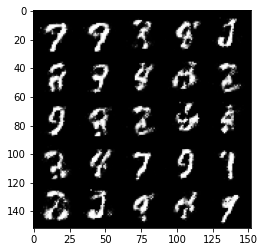

Epoch 74, step 35000: Generator loss: 2.0429900274276718, discriminator loss: 0.32450252360105547


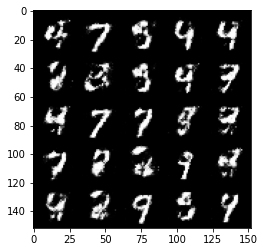

Epoch 75, step 35500: Generator loss: 2.0635061194896713, discriminator loss: 0.3040748870372771


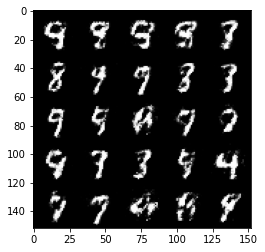

Epoch 76, step 36000: Generator loss: 2.008619315385819, discriminator loss: 0.3163716169595719


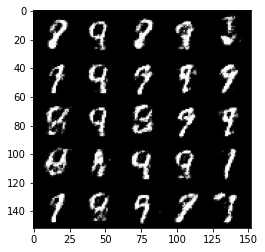

Epoch 77, step 36500: Generator loss: 2.0767402782440207, discriminator loss: 0.3019262564182279


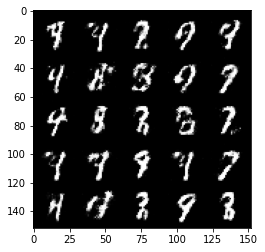

Epoch 78, step 37000: Generator loss: 2.052078072309495, discriminator loss: 0.3150222345292568


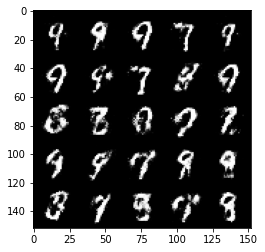

Epoch 79, step 37500: Generator loss: 1.95502869987488, discriminator loss: 0.3351993580162526


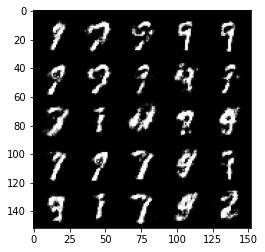

Epoch 81, step 38000: Generator loss: 1.9051413979530343, discriminator loss: 0.3331028495728967


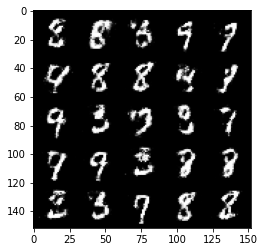

Epoch 82, step 38500: Generator loss: 1.992027830123901, discriminator loss: 0.3279411112964151


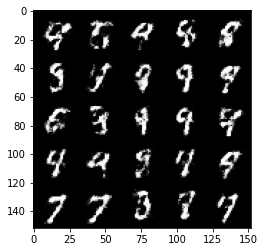

Epoch 83, step 39000: Generator loss: 1.9721229505538946, discriminator loss: 0.32043414619565036


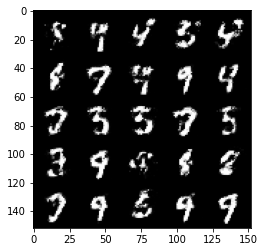

Epoch 84, step 39500: Generator loss: 1.969234401226042, discriminator loss: 0.30370935326814635


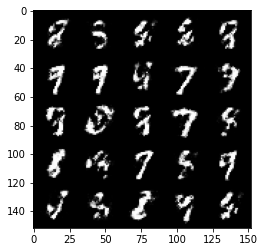

Epoch 85, step 40000: Generator loss: 1.9285597884655017, discriminator loss: 0.33454499280452726


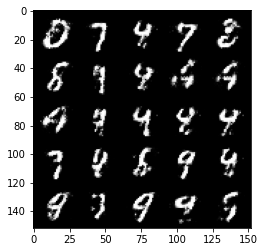

Epoch 86, step 40500: Generator loss: 1.904802727699281, discriminator loss: 0.33759482157230397


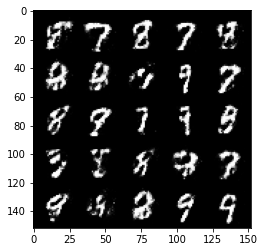

Epoch 87, step 41000: Generator loss: 1.8269239628314975, discriminator loss: 0.36331122601032234


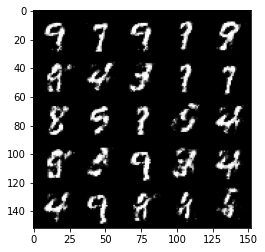

Epoch 88, step 41500: Generator loss: 1.7893389084339162, discriminator loss: 0.3620742268562318


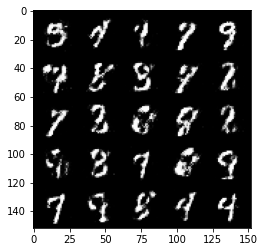

Epoch 89, step 42000: Generator loss: 1.7810113091468807, discriminator loss: 0.36758031523227686


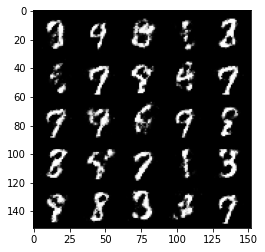

Epoch 90, step 42500: Generator loss: 1.7473945906162276, discriminator loss: 0.36906193286180466


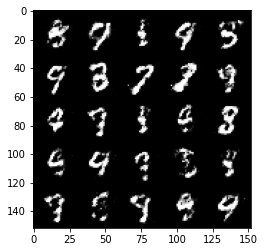

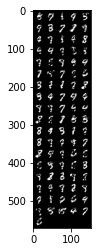

Epoch 91, step 43000: Generator loss: 1.7538205771446231, discriminator loss: 0.37028232735395444


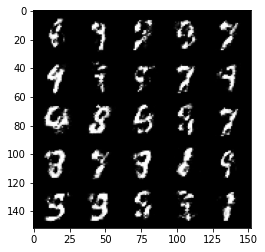

Epoch 92, step 43500: Generator loss: 1.7196499054431926, discriminator loss: 0.3765094327926635


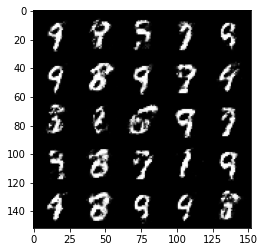

Epoch 93, step 44000: Generator loss: 1.7124908599853526, discriminator loss: 0.37550165575742706


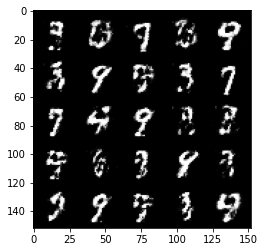

Epoch 94, step 44500: Generator loss: 1.691627561807632, discriminator loss: 0.3755915944576266


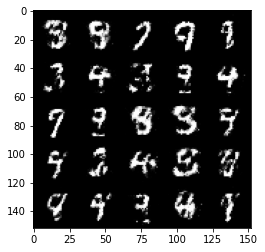

Epoch 95, step 45000: Generator loss: 1.7502480089664456, discriminator loss: 0.3705734030008315


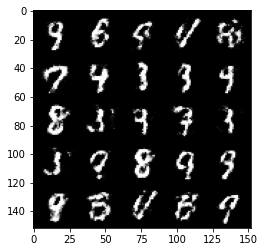

Epoch 97, step 45500: Generator loss: 1.6517446184158333, discriminator loss: 0.3968926941752431


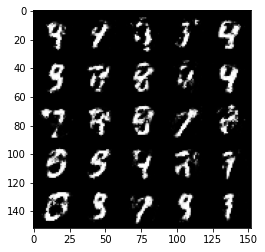

Epoch 98, step 46000: Generator loss: 1.6488399977684016, discriminator loss: 0.38962411206960645


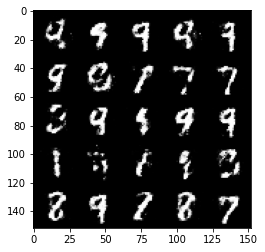

Epoch 99, step 46500: Generator loss: 1.780958218812942, discriminator loss: 0.3469237595200538


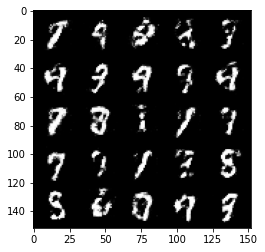

Epoch 100, step 47000: Generator loss: 1.7363181200027462, discriminator loss: 0.36843688642978634


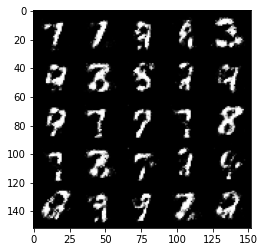

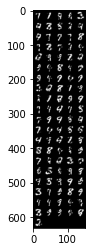

Epoch 101, step 47500: Generator loss: 1.71505840802193, discriminator loss: 0.3765871547460557


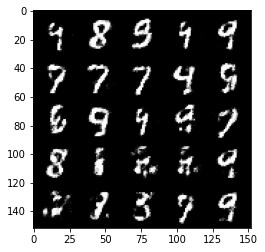

Epoch 102, step 48000: Generator loss: 1.7492885768413555, discriminator loss: 0.3656614496707915


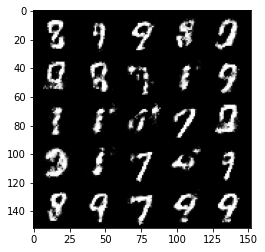

Epoch 103, step 48500: Generator loss: 1.6107619357109069, discriminator loss: 0.40858865910768477


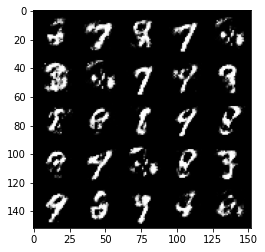

Epoch 104, step 49000: Generator loss: 1.6911686518192286, discriminator loss: 0.3849806046485901


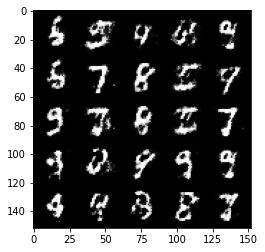

Epoch 105, step 49500: Generator loss: 1.7256628594398493, discriminator loss: 0.3834681606292722


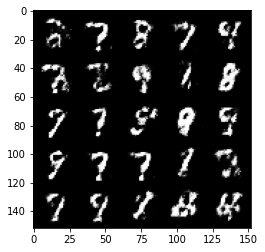

Epoch 106, step 50000: Generator loss: 1.651101076364518, discriminator loss: 0.39478764551877965


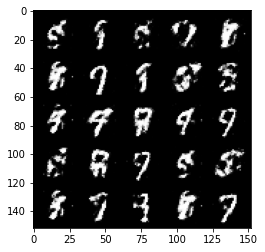

Epoch 107, step 50500: Generator loss: 1.686832185029983, discriminator loss: 0.38538392984867104


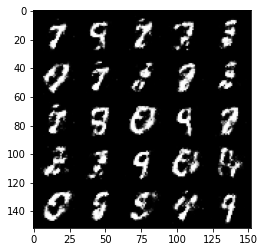

Epoch 108, step 51000: Generator loss: 1.7654043369293206, discriminator loss: 0.3629744143486022


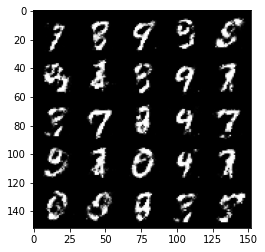

Epoch 109, step 51500: Generator loss: 1.7720387818813326, discriminator loss: 0.3657101810574533


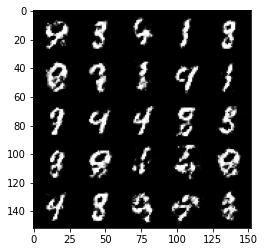

Epoch 110, step 52000: Generator loss: 1.6667121317386635, discriminator loss: 0.3932834094166756


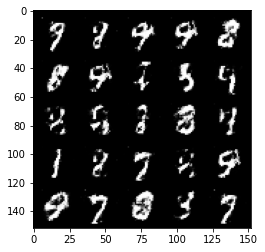

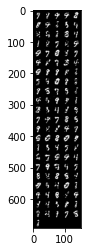

Epoch 111, step 52500: Generator loss: 1.7409551420211788, discriminator loss: 0.35442832061648366


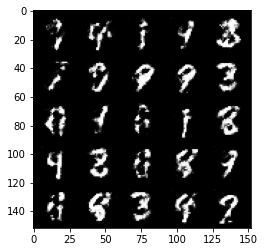

Epoch 113, step 53000: Generator loss: 1.6865573327541354, discriminator loss: 0.37676983106136314


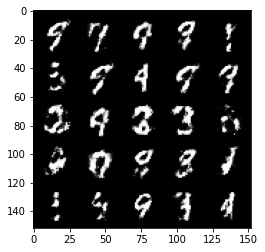

Epoch 114, step 53500: Generator loss: 1.7493721125125878, discriminator loss: 0.36414491236209817


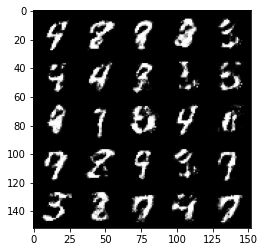

Epoch 115, step 54000: Generator loss: 1.6504667446613308, discriminator loss: 0.39703360396623616


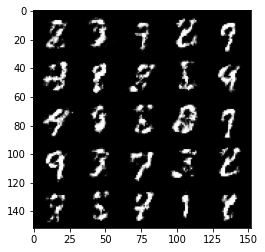

Epoch 116, step 54500: Generator loss: 1.6046696391105644, discriminator loss: 0.4024486531019209


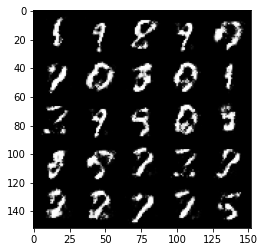

Epoch 117, step 55000: Generator loss: 1.6729675245285027, discriminator loss: 0.3865246028900147


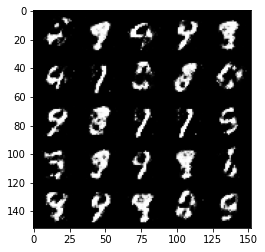

Epoch 118, step 55500: Generator loss: 1.6616484117507921, discriminator loss: 0.3808960637450219


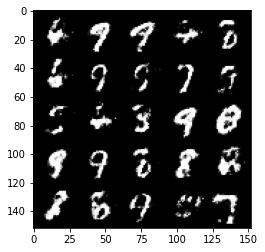

Epoch 119, step 56000: Generator loss: 1.684497730016708, discriminator loss: 0.3789916793107984


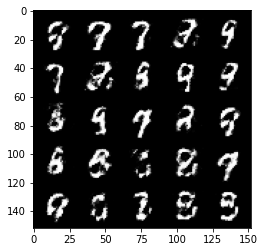

Epoch 120, step 56500: Generator loss: 1.5868600378036495, discriminator loss: 0.40841458123922303


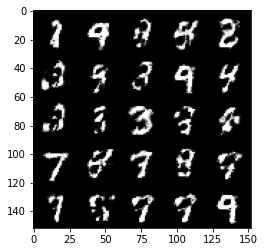

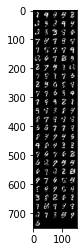

Epoch 121, step 57000: Generator loss: 1.5473083906173708, discriminator loss: 0.4155094746351243


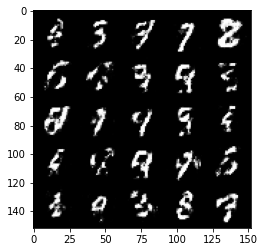

Epoch 122, step 57500: Generator loss: 1.5859761657714855, discriminator loss: 0.38750679230690027


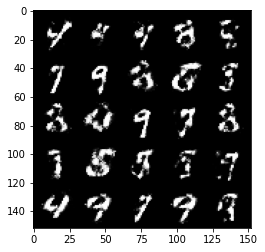

Epoch 123, step 58000: Generator loss: 1.5943246281147017, discriminator loss: 0.40056963151693387


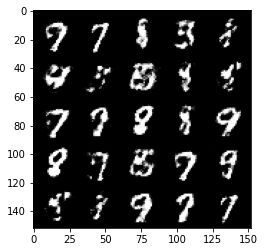

Epoch 124, step 58500: Generator loss: 1.540159080743788, discriminator loss: 0.41689755272865336


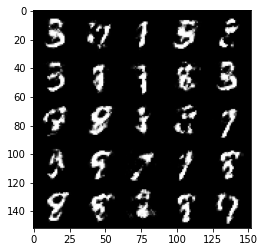

Epoch 125, step 59000: Generator loss: 1.5454794471263895, discriminator loss: 0.408373119354248


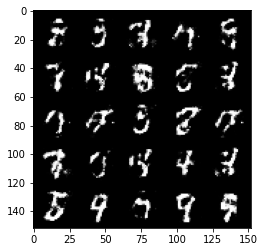

Epoch 126, step 59500: Generator loss: 1.6840749690532688, discriminator loss: 0.3744727548360821


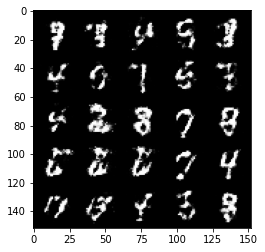

Epoch 127, step 60000: Generator loss: 1.6400358316898331, discriminator loss: 0.3922024269104005


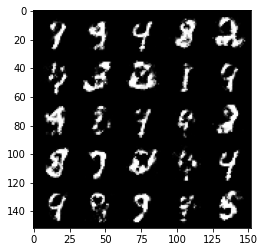

Epoch 128, step 60500: Generator loss: 1.5576174795627578, discriminator loss: 0.41524611628055563


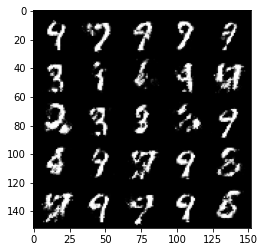

Epoch 130, step 61000: Generator loss: 1.645680354595184, discriminator loss: 0.3863378104567528


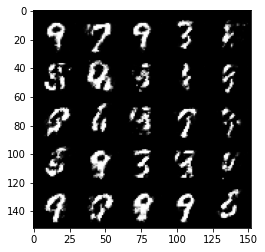

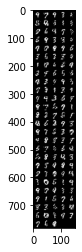

Epoch 131, step 61500: Generator loss: 1.543178698062896, discriminator loss: 0.41123378193378446


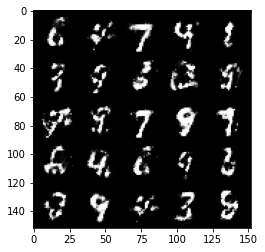

Epoch 132, step 62000: Generator loss: 1.5653365049362196, discriminator loss: 0.40586743646860146


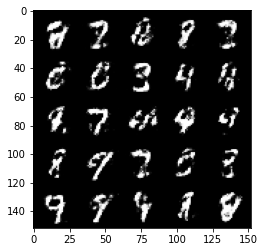

Epoch 133, step 62500: Generator loss: 1.5413958330154418, discriminator loss: 0.4054680818319317


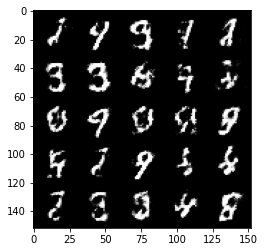

Epoch 134, step 63000: Generator loss: 1.5575494067668911, discriminator loss: 0.4002199299931524


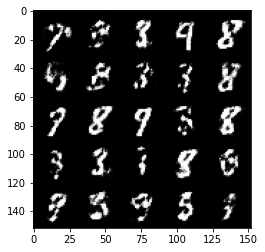

Epoch 135, step 63500: Generator loss: 1.553189319849013, discriminator loss: 0.4058452241420743


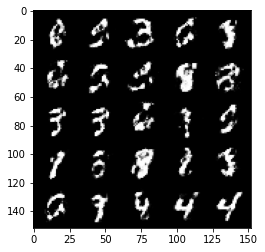

Epoch 136, step 64000: Generator loss: 1.5716713848114034, discriminator loss: 0.4011503995060923


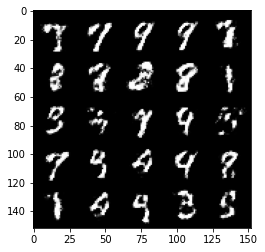

Epoch 137, step 64500: Generator loss: 1.5281532094478603, discriminator loss: 0.4148037988543509


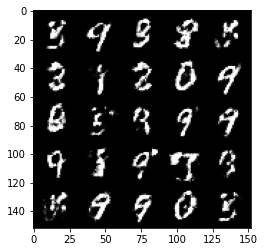

Epoch 138, step 65000: Generator loss: 1.5360518102645875, discriminator loss: 0.41235620272159546


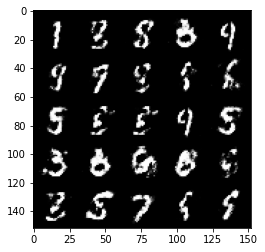

Epoch 139, step 65500: Generator loss: 1.546622401952743, discriminator loss: 0.40565371257066696


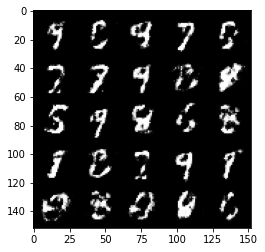

Epoch 140, step 66000: Generator loss: 1.5255835070610049, discriminator loss: 0.4101008334755896


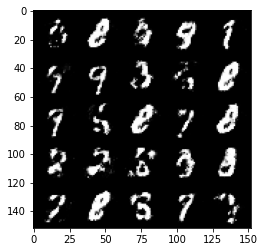

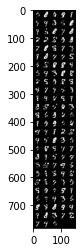

Epoch 141, step 66500: Generator loss: 1.4952970175743108, discriminator loss: 0.4074640897512432


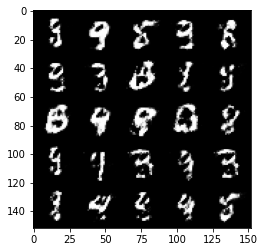

Epoch 142, step 67000: Generator loss: 1.5512958176136042, discriminator loss: 0.4048976695537567


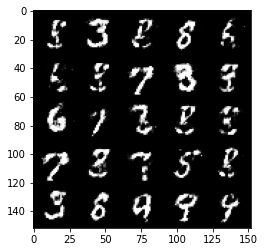

Epoch 143, step 67500: Generator loss: 1.5032602450847627, discriminator loss: 0.41506077450513806


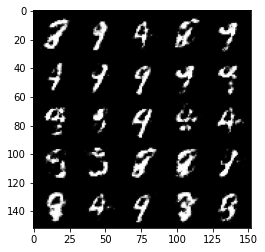

Epoch 144, step 68000: Generator loss: 1.4896844260692577, discriminator loss: 0.4325562687516215


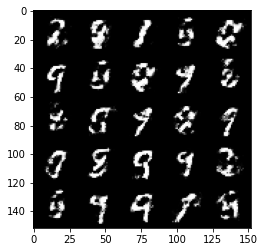

Epoch 146, step 68500: Generator loss: 1.4690887377262107, discriminator loss: 0.4344876600503922


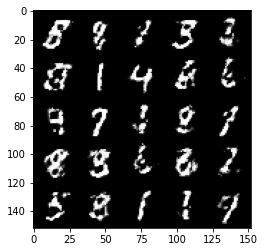

Epoch 147, step 69000: Generator loss: 1.5252866339683522, discriminator loss: 0.4206062557697296


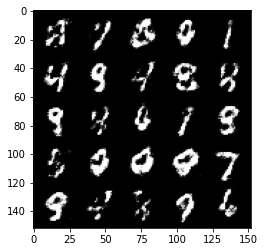

Epoch 148, step 69500: Generator loss: 1.450228613853454, discriminator loss: 0.44115600913763053


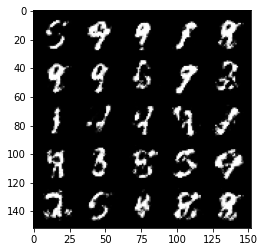

Epoch 149, step 70000: Generator loss: 1.5163740515708932, discriminator loss: 0.41267478096485155


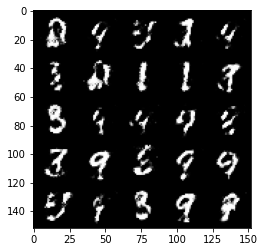

Epoch 150, step 70500: Generator loss: 1.5159333429336552, discriminator loss: 0.41458457005023985


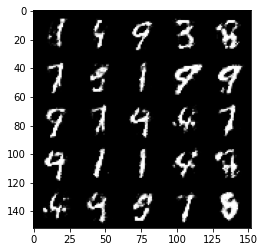

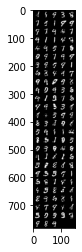

Epoch 151, step 71000: Generator loss: 1.4538612909317035, discriminator loss: 0.43200839155912396


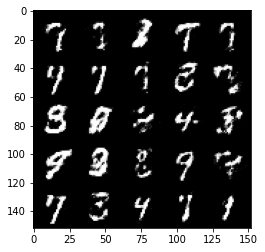

Epoch 152, step 71500: Generator loss: 1.4807093329429624, discriminator loss: 0.4162906423211096


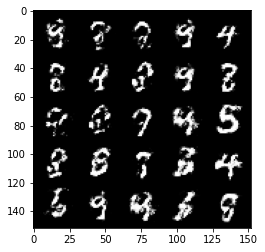

Epoch 153, step 72000: Generator loss: 1.4781035861968994, discriminator loss: 0.4291832000017165


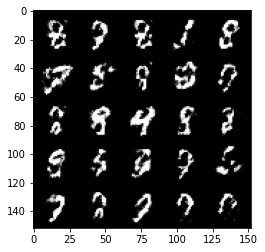

Epoch 154, step 72500: Generator loss: 1.3662775406837466, discriminator loss: 0.4631566247940068


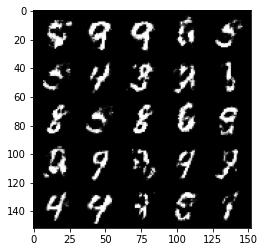

Epoch 155, step 73000: Generator loss: 1.390963028669358, discriminator loss: 0.4574454810619354


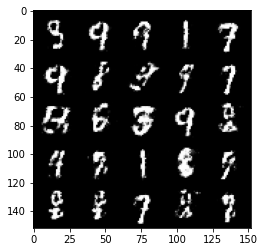

Epoch 156, step 73500: Generator loss: 1.4340725162029262, discriminator loss: 0.4286178391575814


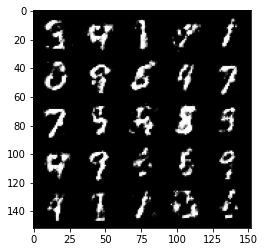

Epoch 157, step 74000: Generator loss: 1.4044986624717715, discriminator loss: 0.4600637344121932


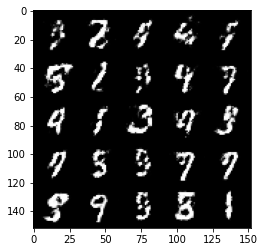

Epoch 158, step 74500: Generator loss: 1.4839442789554602, discriminator loss: 0.4203800931572916


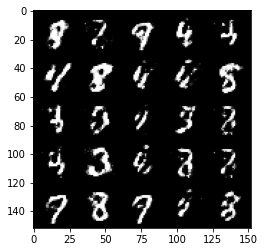

Epoch 159, step 75000: Generator loss: 1.4459757335185999, discriminator loss: 0.4277013641595837


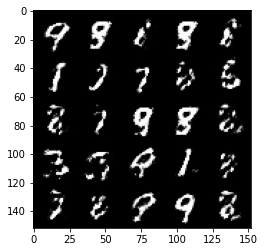

Epoch 160, step 75500: Generator loss: 1.4245393962860105, discriminator loss: 0.4409572631716727


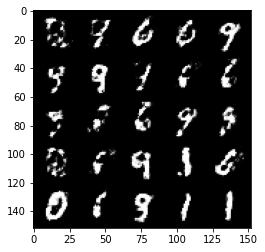

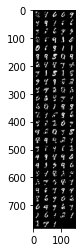

Epoch 162, step 76000: Generator loss: 1.3032466518878918, discriminator loss: 0.4682074211239815


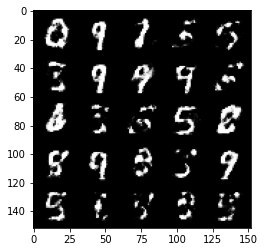

Epoch 163, step 76500: Generator loss: 1.392959629297256, discriminator loss: 0.4484690408110615


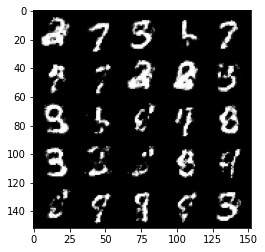

Epoch 164, step 77000: Generator loss: 1.426917770385742, discriminator loss: 0.43678437811136206


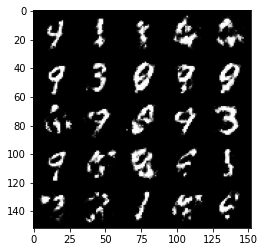

Epoch 165, step 77500: Generator loss: 1.3889952542781834, discriminator loss: 0.4575573794245718


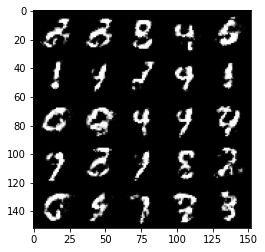

Epoch 166, step 78000: Generator loss: 1.3947445960044869, discriminator loss: 0.4532461619973181


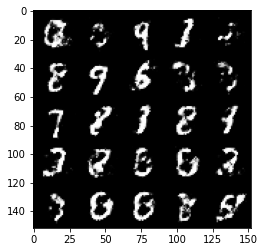

Epoch 167, step 78500: Generator loss: 1.4289874310493473, discriminator loss: 0.43028995388746283


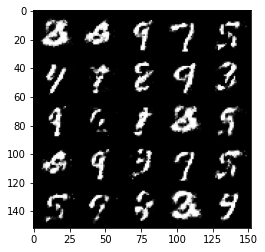

Epoch 168, step 79000: Generator loss: 1.4860824654102323, discriminator loss: 0.4069642816781999


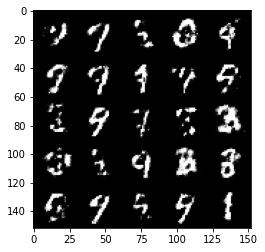

Epoch 169, step 79500: Generator loss: 1.4274117763042447, discriminator loss: 0.44261477315425823


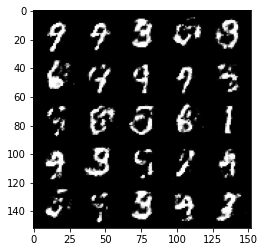

Epoch 170, step 80000: Generator loss: 1.3297264025211333, discriminator loss: 0.4671393731832505


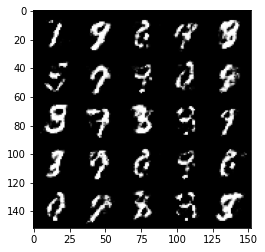

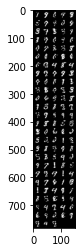

Epoch 171, step 80500: Generator loss: 1.4382750988006596, discriminator loss: 0.4290718637108807


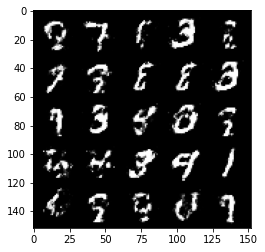

Epoch 172, step 81000: Generator loss: 1.2865506126880644, discriminator loss: 0.4830137018561365


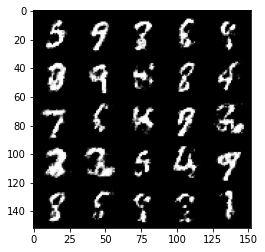

Epoch 173, step 81500: Generator loss: 1.317949891805648, discriminator loss: 0.4710689966082572


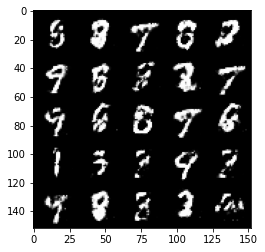

Epoch 174, step 82000: Generator loss: 1.3014649531841282, discriminator loss: 0.4796499108076095


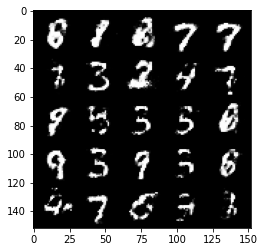

Epoch 175, step 82500: Generator loss: 1.3317865934371953, discriminator loss: 0.4699620223641397


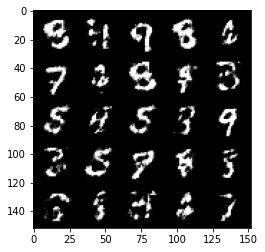

Epoch 176, step 83000: Generator loss: 1.3692343113422407, discriminator loss: 0.46088656002283057


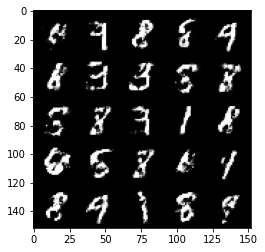

Epoch 178, step 83500: Generator loss: 1.3464679777622233, discriminator loss: 0.4619037117958068


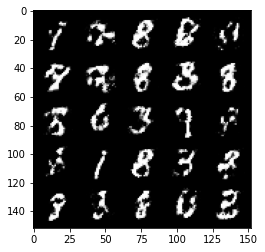

Epoch 179, step 84000: Generator loss: 1.3420159845352184, discriminator loss: 0.46303567206859564


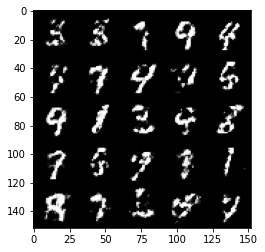

Epoch 180, step 84500: Generator loss: 1.407583713293076, discriminator loss: 0.44718073326349245


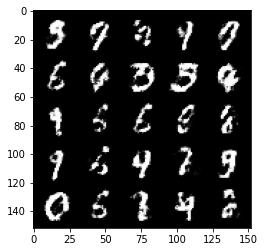

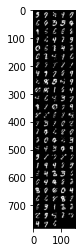

Epoch 181, step 85000: Generator loss: 1.3392056486606587, discriminator loss: 0.4596219133138657


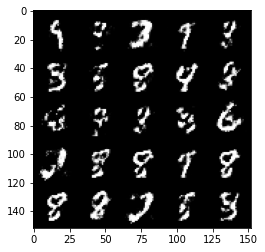

Epoch 182, step 85500: Generator loss: 1.3391689441204067, discriminator loss: 0.45558763915300377


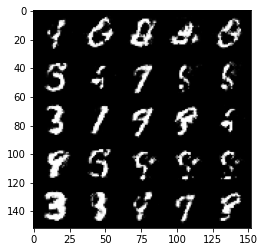

Epoch 183, step 86000: Generator loss: 1.3271668844223041, discriminator loss: 0.46796145820617663


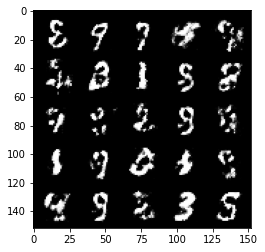

Epoch 184, step 86500: Generator loss: 1.3192748589515675, discriminator loss: 0.464880983769894


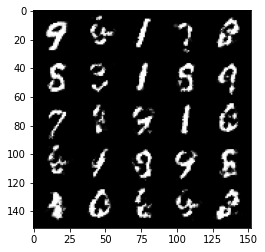

Epoch 185, step 87000: Generator loss: 1.363873656749727, discriminator loss: 0.4529578717350963


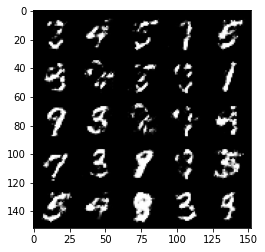

Epoch 186, step 87500: Generator loss: 1.2897454998493199, discriminator loss: 0.4825239085555073


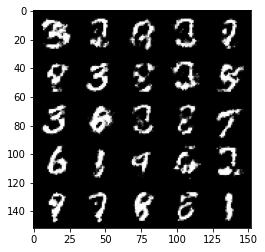

Epoch 187, step 88000: Generator loss: 1.1979566973447795, discriminator loss: 0.522457891881466


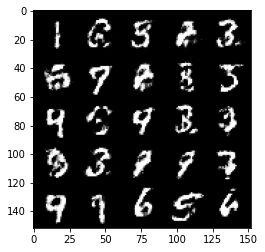

Epoch 188, step 88500: Generator loss: 1.2372088173627849, discriminator loss: 0.49950096827745405


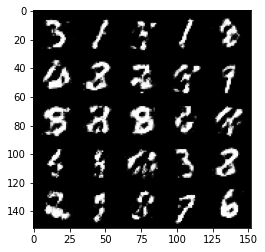

Epoch 189, step 89000: Generator loss: 1.3125350127220152, discriminator loss: 0.47583533346652984


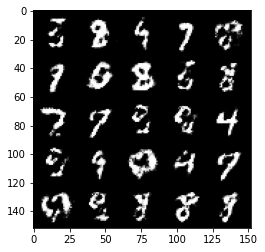

Epoch 190, step 89500: Generator loss: 1.1605847264528286, discriminator loss: 0.5366894651055335


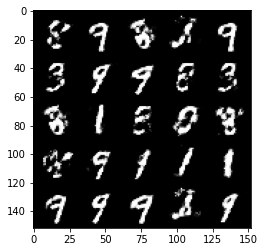

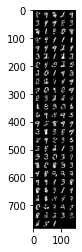

Epoch 191, step 90000: Generator loss: 1.2231414548158648, discriminator loss: 0.5059533592462541


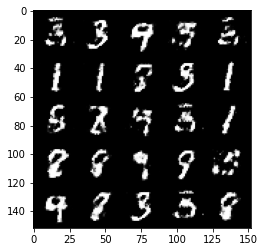

Epoch 192, step 90500: Generator loss: 1.2249841890335094, discriminator loss: 0.503442988097668


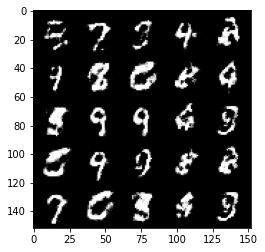

Epoch 194, step 91000: Generator loss: 1.2157909171581267, discriminator loss: 0.5085406680703161


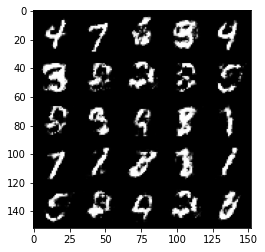

Epoch 195, step 91500: Generator loss: 1.2351938551664368, discriminator loss: 0.48726452213525745


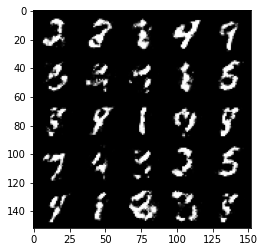

Epoch 196, step 92000: Generator loss: 1.269505294203758, discriminator loss: 0.4719595478773117


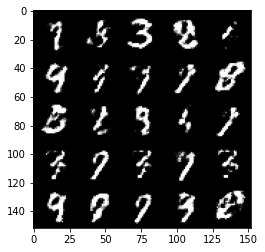

Epoch 197, step 92500: Generator loss: 1.2167636368274692, discriminator loss: 0.49072467052936575


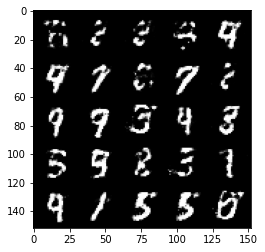

Epoch 198, step 93000: Generator loss: 1.1880939954519278, discriminator loss: 0.5056795087456701


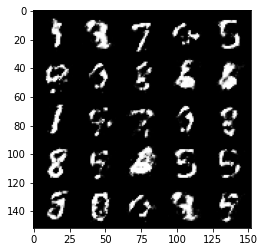

Epoch 199, step 93500: Generator loss: 1.1662327175140381, discriminator loss: 0.5026562691330912


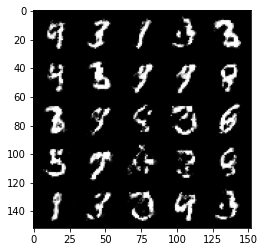

In [25]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False

for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            #show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1

    if (epoch % 10) == 0:
        torch.save(gen.state_dict(), 'generator/gen_model_%03d.h5' % (epoch+1))
        torch.save(disc.state_dict(), 'discriminator/disc_model_%03d.h5' % (epoch+1))